<p style="font-size:30px; color:red; font-weight:bold; font-style:italic;"> Case Study 2: Real Estate Image Classification using Deep Learning</p>

<p style="font-size:25px; color:balck; font-weight:bold; font-style:italic;">12.&ensp;Error Analysis on the best performing model: EfficientNetB0</p>

* <p style="font-size:14px; color:blue; font-style:italic; ">importing modules</p>

In [1]:
# Importing mudules
import numpy as np
import pandas as pd
import cv2 as cv
import pickle as pkl

import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow.keras.applications.efficientnet import preprocess_input, EfficientNetB0
# importing my custom defined functions module in this notebook
import rei_functions as rf

# importing lime module for iterpreting our image classifier model
from lime import lime_image

# to filter warnings
from warnings import filterwarnings
filterwarnings('ignore')

* <p style="font-size:14px; color:blue; font-style:italic; ">Loading train and test from disk to analyse errors using EfficientNetB0 model</p>

In [2]:
train = pd.read_csv('train_set.csv')
val = pd.read_csv('val_set.csv')

In [3]:
class_list = rf.load_class_labels_list()
print(f"Class labels are: {class_list}")

Class labels are: ['backyard', 'bathroom', 'bedroom', 'frontyard', 'kitchen', 'livingRoom']


* <p style="font-size:14px; color:blue; font-style:italic; ">Initializing EfficientNetB0 model</p>

In [4]:
BATCH_SIZE = 8
EPOCHS = 25
H, W = 224, 224
INPUT_SHAPE = (H,W,3)
TARGET_SHAPE = (H,W)
NUM_CLASSES = 6

In [5]:
efficientNet_model = rf.get_model_ready()
# summarizing model
efficientNet_model.summary()

Model: "efficientNet_based_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_shape (InputLayer)     [(None, 224, 224, 3)]     0         
_________________________________________________________________
efficientnetb0 (Functional)  (None, 7, 7, 1280)        4049571   
_________________________________________________________________
global_pooling (GlobalAverag (None, 1280)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              1311744   
_________________________________________________________________
dropout_1 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                65600     
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)   

* <p style="font-size:14px; color:blue; font-style:italic; ">Loading pretrained EfficientNetB0 model</p>

In [6]:
efficientNet_model.load_weights("efficientNetB0_model.h5")

* <p style="font-size:14px; color:blue; font-style:italic; ">Let's analyse one by one images whose actual and prediction labels are not same</p>

In [7]:
#plot image funtion
def plot_img(ax, img):
    """this function will take axes and img as input and plot it"""
    ax.imshow(cv.resize(img[0], (256,256), cv.INTER_AREA))
    ax.set_title(f"Actual: {img[1]}\nPredicted: {img[2]}")
    ax.axes.get_xaxis().set_ticks([])
    ax.axes.get_yaxis().set_ticks([])
    return ax

In [8]:
# predict class label and plot image if actual and predicted labels are not similar
def analyse_error(data, model):
    """this function will help in analysing false positives and false negatives."""
    # an empty list to store path of wrong predicted images
    misclassified_datapoints, images_to_plot = list(), list()
    # for each data point in dataset
    for img_details in data.values:
        # spliting image path and its label
        path, actual_label = img_details[0], img_details[1]
        # reading image from disk
        img = cv.imread(path, cv.IMREAD_UNCHANGED)
        # enhancing image
        inp_img = rf.get_enhanced_image(img)
        # resizing image of required dimension
        inp_img = cv.resize(inp_img, TARGET_SHAPE, cv.INTER_AREA)
        # preprocessing image using pretrained weight, preprocessing function
        inp_img = preprocess_input(inp_img)
        # expanding dimension of image to make it in (batch_size, height, width, channels) format
        inp_img = tf.expand_dims(inp_img, axis=0)
        # predicting and finding the class label index
        yhat = np.argmax(model.predict(inp_img))
        # getting class label name by using predicted class label index
        predicted_label = class_list[yhat]
        # if actual label and predicted labels are not same
        if actual_label != predicted_label:
            # appending img path and actual label in list
            misclassified_datapoints.append([img_details, actual_label])
            # changing color channel fom BGR -----> RGB channel to plot in notebook
            img = img[:,:,::-1]
            # appending images with actual and predicted labels in list to plot 3- images at time in 1-row, 3-cols      
            images_to_plot.append([img, actual_label, predicted_label])
            # showing image if list contains 5 images
            num_images = len(images_to_plot)
            # if 5 images appended to the list 
            if num_images%6==0:
                # then initialise 5 fig
                axis = ['ax'+str(i) for i in range(num_images)]
                fig, axis = plt.subplots(nrows=1, ncols=num_images, figsize=(15,5))
                # for each figure in axis
                for ax, img in zip(axis, images_to_plot):
                    # plot 1 fig per 1 axis
                    plot_img(ax, img)
                # showing plots
                plt.show()
                # draw a line to distinguish images rows from each others
                print('__'*55)
                # making images to plot list so that it can never keep more than 5 images
                images_to_plot = list()
    # if all the images have been predicted and plotted then
    # if some images left in images to plot list which counts must be less than 5 than plot them here
    num_images = len(images_to_plot)
    # condition if num of images in list less than 5
    if 0 < num_images < 6:
        # then initialising figs equals num_images
        axis = ['ax'+str(i) for i in range(num_images)]
        # for each figures in subplots
        fig, axis = plt.subplots(nrows=1, ncols=num_images, figsize=(15,5))
        for ax, img in zip(axis, images_to_plot):
            # plot it in respected figure
            plot_img(ax, img)
        # and then shows plot
        plt.show()
    # return number of misclassified points in given dataset
    return misclassified_datapoints

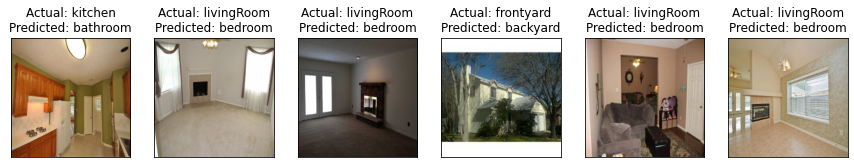

______________________________________________________________________________________________________________


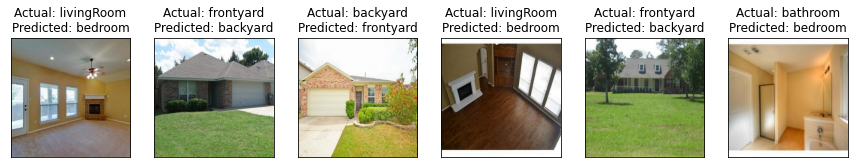

______________________________________________________________________________________________________________


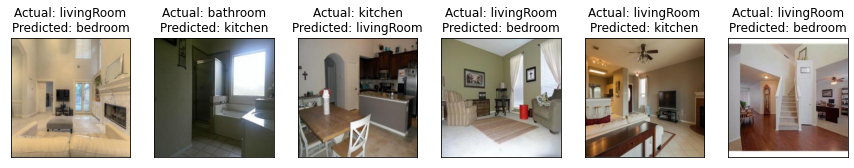

______________________________________________________________________________________________________________


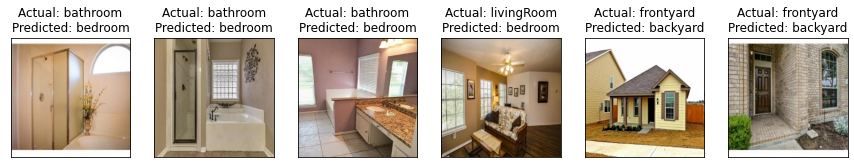

______________________________________________________________________________________________________________


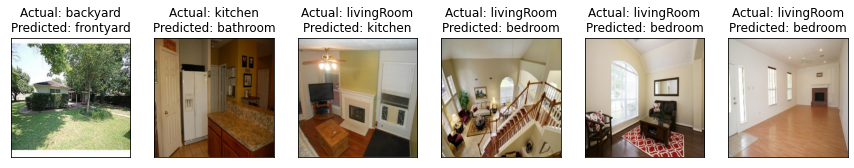

______________________________________________________________________________________________________________


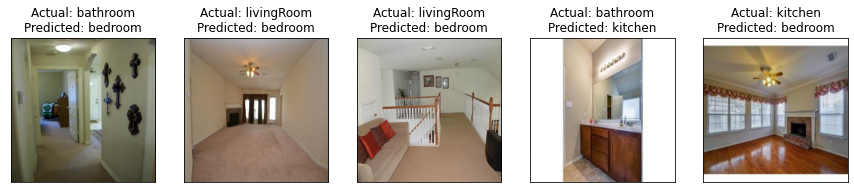

In [9]:
# analysis on train set
train_sample = train.sample(1001)
train_misclassified_datapoints = analyse_error(train_sample, efficientNet_model)

In [10]:
print(f"Number of misclassified points in train set: {len(train_misclassified_datapoints)}")

Number of misclassified points in train set: 35


<p style="font-size:14px; color:green; font-style:italic; ">There are 44 total misclassified images from Train set</p>

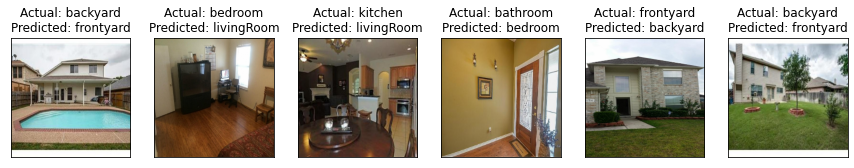

______________________________________________________________________________________________________________


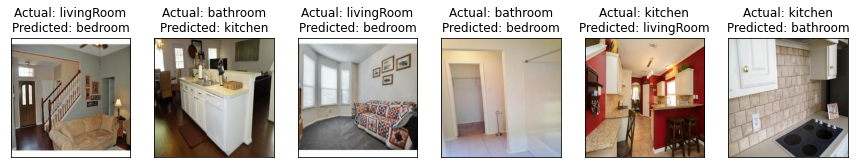

______________________________________________________________________________________________________________


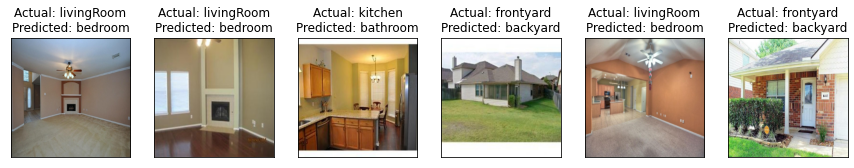

______________________________________________________________________________________________________________


In [11]:
# analysis on test set
val_sample = val.sample(400)
val_misclassified_datapoints = analyse_error(val_sample, efficientNet_model)

In [12]:
print(f"Number of misclassified points in val set: {len(val_misclassified_datapoints)}")

Number of misclassified points in val set: 18


<p style="font-size:14px; color:green; font-style:italic; ">There are 44 total misclassified images from val/test set</p>

* <p style="font-size:14px; color:blue; font-style:italic; ">Let's Interpret what causes the model to predict respected label. I got to know about LIME from this <a href="https://towardsdatascience.com/interpreting-image-classification-model-with-lime-1e7064a2f2e5">blog</a> and <a href="https://lime-ml.readthedocs.io/en/latest/lime.html#module-lime.lime_image">lime package</a></p>

<p style="font-size:14px; color:black; font-style:italic; ">
    LIME stands for Local Interpretable Model-agnostic Explanations. It is a Python based to library used to help us understand the behavior of  black-box classifier model. Currently, it supports for a classifier model that classify tabular data, images, or texts. 
</p>

* <p style="font-size:14px; color:black; font-style:italic; ">Model agnostic, which means that LIME is model-independent. In other words, LIME is able to explain any black-box classifier you can think of.</p>

* <p style="font-size:14px; color:black; font-style:italic; ">Interpretable, which means that LIME provides you a solution to understand why your model behaves the way it does.</p>

* <p style="font-size:14px; color:black; font-style:italic; ">Local, which means that LIME tries to find the explanation of your black-box model by approximating the local linear behavior of your model.</p>

In [13]:
# initialising lime object
explainer = lime_image.LimeImageExplainer()

In [14]:
def get_mask_boundaries(img):
    """this function will return mask and masked object in image of the weighted class which was predicted by model"""
    explaination = explainer.explain_instance(img, 
                                          efficientNet_model.predict, 
                                          top_labels=6, 
                                          hide_color=0, 
                                          num_samples=1000, 
                                          num_features=100)
    temp_1, mask_1 = explaination.get_image_and_mask(explaination.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
    temp_2, mask_2 = explaination.get_image_and_mask(explaination.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    
    return temp_1, mask_1, temp_2, mask_2

In [15]:
from skimage.segmentation import mark_boundaries

def mark_boundaries_on_image(img, temp_1, mask_1, temp_2, mask_2, actual_label, predicted_label, weights):
    """this function will plot original image, masked image and masked area in green color in original image"""
    w = round(weights[predicted_label], 4)
    fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(10,5))
    ax1.imshow(img)
    ax2.imshow(mark_boundaries(temp_1, mask_1)*255)
    ax3.imshow(mark_boundaries(temp_2, mask_2))
    ax1.axis('off')
    ax2.axis('off')
    ax3.axis('off')
    ax1.set_title(f"Actual: {actual_label}")
    ax2.set_title(f"Masked pixels\ncontribute in\nclassifying\n{predicted_label}")
    ax3.set_title(f"Predicted: {predicted_label}")
    plt.show()

* <p style="font-size:14px; color:blue; font-style:italic; ">Let's see what causes the model to predict correct labels in val/test data.</p>

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 1.0, 'livingRoom': 0.0, 'bathroom': 0.0, 'kitchen': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


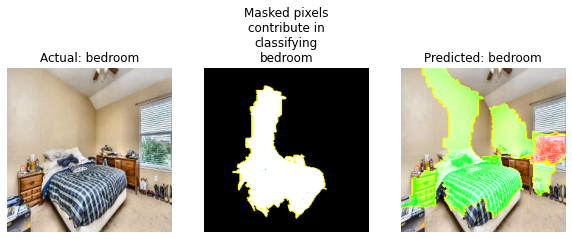

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'backyard': 0.9983, 'frontyard': 0.0017, 'bedroom': 0.0, 'livingRoom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


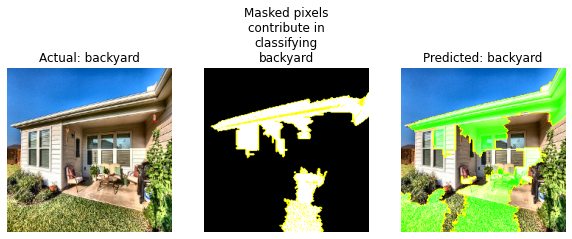

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.9956, 'livingRoom': 0.0044, 'bathroom': 0.0, 'kitchen': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


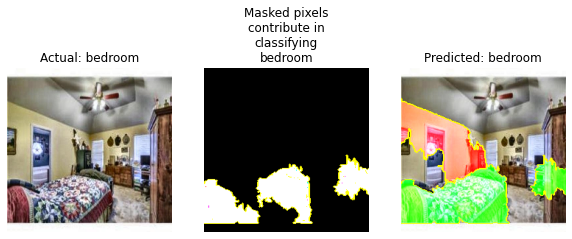

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bathroom': 1.0, 'kitchen': 0.0, 'bedroom': 0.0, 'livingRoom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


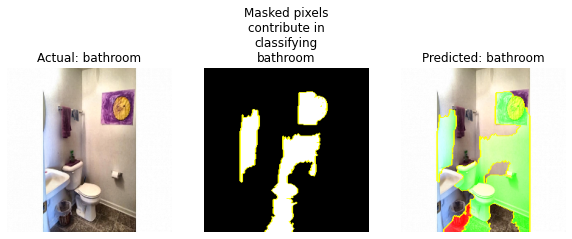

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'frontyard': 0.9851, 'backyard': 0.0149, 'livingRoom': 0.0, 'bedroom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


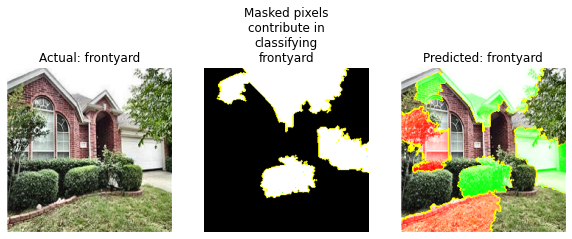

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'kitchen': 1.0, 'livingRoom': 0.0, 'bathroom': 0.0, 'bedroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


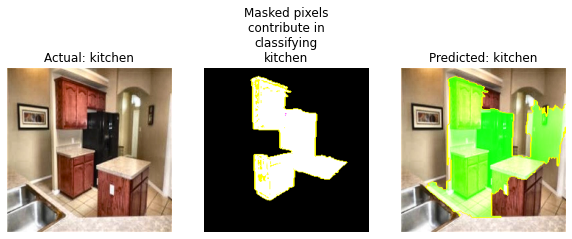

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.9827, 'livingRoom': 0.0147, 'bathroom': 0.0018, 'kitchen': 0.0007, 'backyard': 0.0, 'frontyard': 0.0}


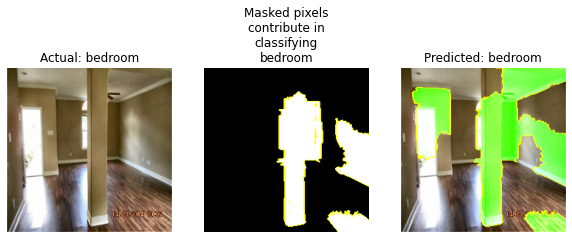

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'kitchen': 1.0, 'livingRoom': 0.0, 'bathroom': 0.0, 'bedroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


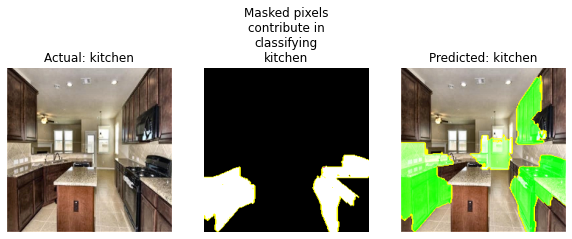

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'kitchen': 1.0, 'livingRoom': 0.0, 'bathroom': 0.0, 'bedroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


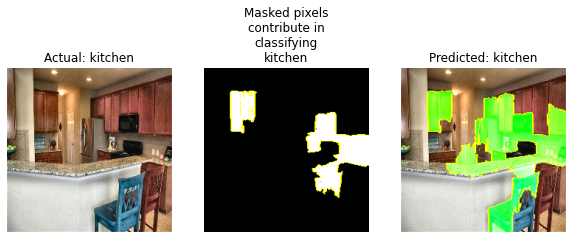

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'livingRoom': 0.766, 'bedroom': 0.234, 'kitchen': 0.0, 'bathroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


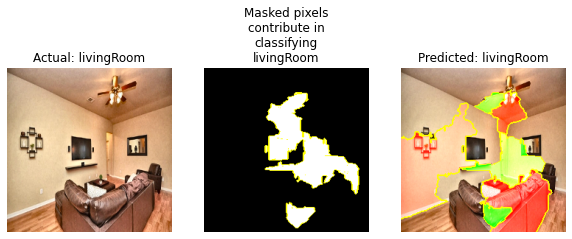

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bathroom': 1.0, 'kitchen': 0.0, 'bedroom': 0.0, 'livingRoom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


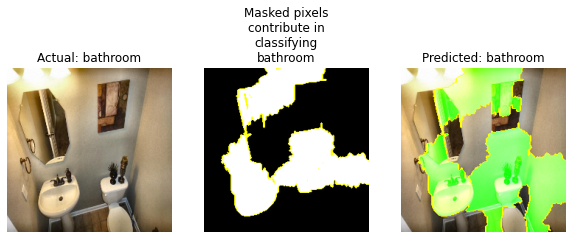

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'livingRoom': 0.9981, 'bedroom': 0.0018, 'kitchen': 1e-04, 'bathroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


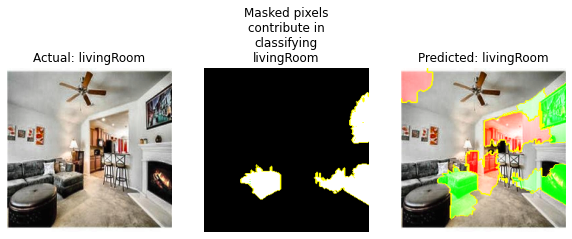

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.8717, 'livingRoom': 0.1139, 'kitchen': 0.0119, 'bathroom': 0.0026, 'backyard': 0.0, 'frontyard': 0.0}


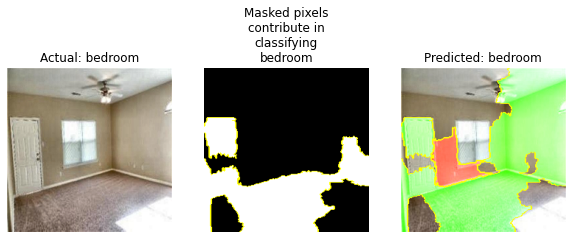

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bathroom': 0.995, 'kitchen': 0.0043, 'bedroom': 0.0007, 'livingRoom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


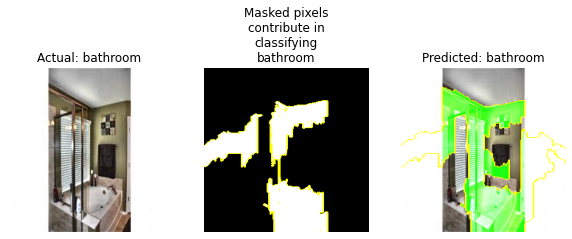

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'backyard': 1.0, 'frontyard': 0.0, 'bedroom': 0.0, 'livingRoom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


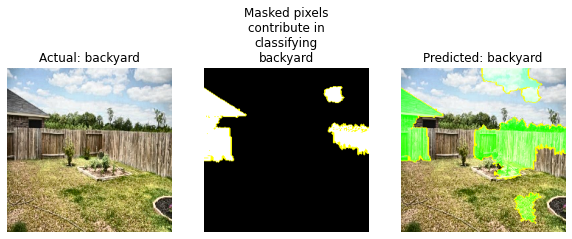

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.9991, 'livingRoom': 0.0009, 'bathroom': 0.0, 'kitchen': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


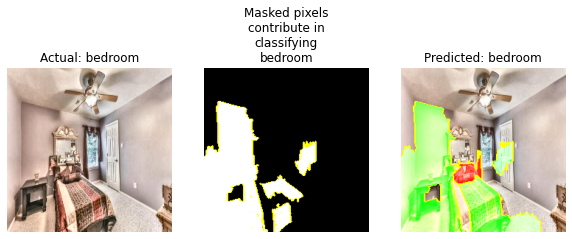

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.9927, 'livingRoom': 0.0073, 'bathroom': 0.0, 'kitchen': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


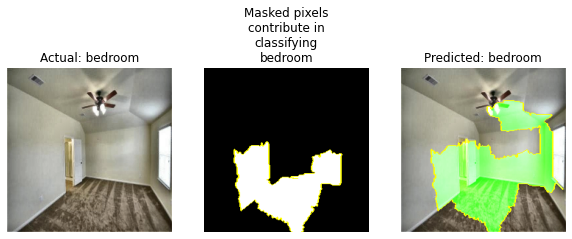

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'frontyard': 1.0, 'backyard': 0.0, 'livingRoom': 0.0, 'bedroom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


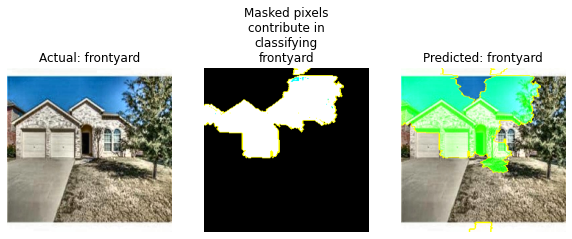

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'frontyard': 0.998, 'backyard': 0.002, 'livingRoom': 0.0, 'bedroom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


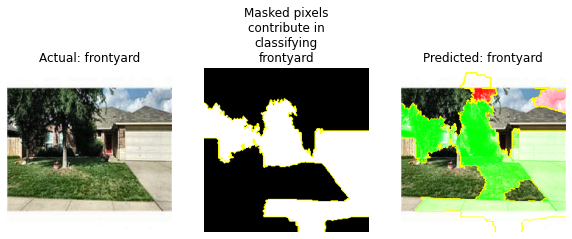

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bathroom': 1.0, 'kitchen': 0.0, 'bedroom': 0.0, 'livingRoom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


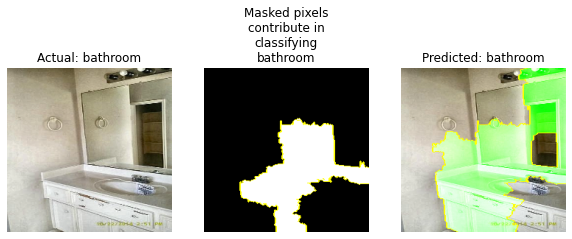

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'backyard': 0.8589, 'frontyard': 0.1411, 'bedroom': 0.0, 'kitchen': 0.0, 'livingRoom': 0.0, 'bathroom': 0.0}


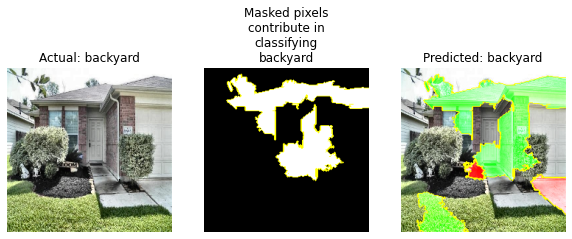

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

weights: {'backyard': 0.9902, 'frontyard': 0.0098, 'bedroom': 0.0, 'kitchen': 0.0, 'livingRoom': 0.0, 'bathroom': 0.0}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


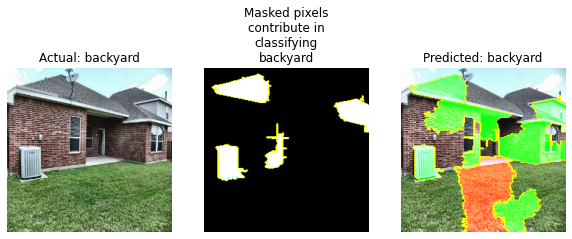

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.9996, 'livingRoom': 0.0004, 'bathroom': 0.0, 'kitchen': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


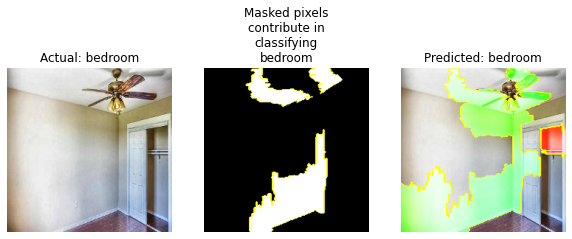

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.9999, 'livingRoom': 1e-04, 'bathroom': 0.0, 'kitchen': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


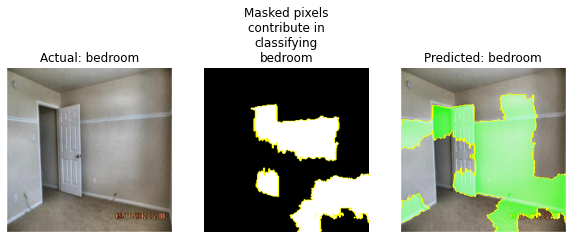

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'livingRoom': 0.9725, 'bedroom': 0.0275, 'kitchen': 0.0, 'bathroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


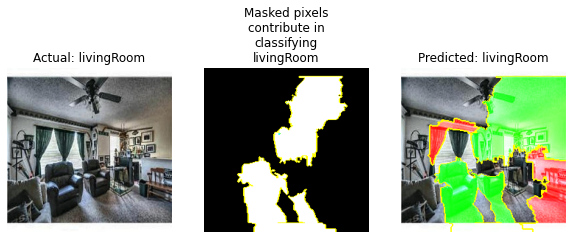

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

weights: {'backyard': 1.0, 'frontyard': 0.0, 'bedroom': 0.0, 'livingRoom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


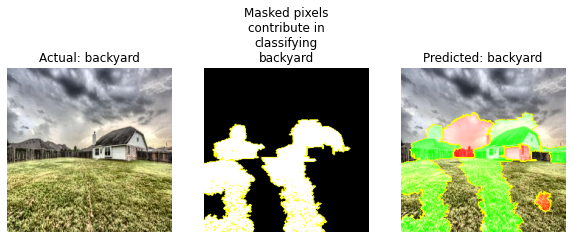

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'backyard': 1.0, 'frontyard': 0.0, 'bedroom': 0.0, 'livingRoom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


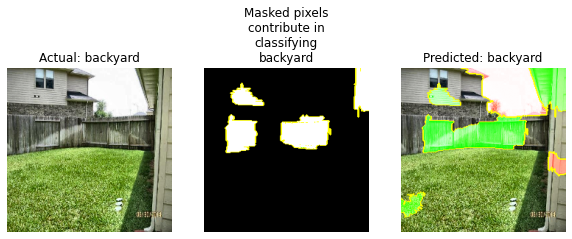

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.9805, 'livingRoom': 0.0185, 'kitchen': 0.0006, 'bathroom': 0.0005, 'backyard': 0.0, 'frontyard': 0.0}


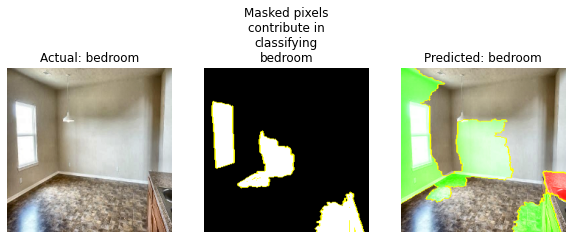

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'backyard': 0.9402, 'frontyard': 0.0598, 'bedroom': 0.0, 'kitchen': 0.0, 'livingRoom': 0.0, 'bathroom': 0.0}


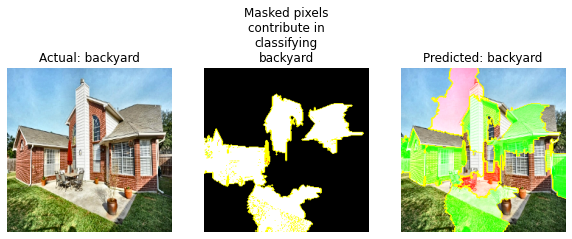

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

weights: {'bathroom': 1.0, 'kitchen': 0.0, 'bedroom': 0.0, 'livingRoom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


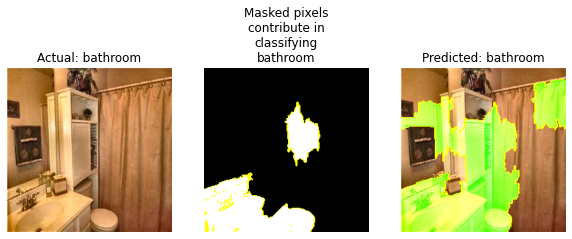

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bathroom': 1.0, 'kitchen': 0.0, 'bedroom': 0.0, 'livingRoom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


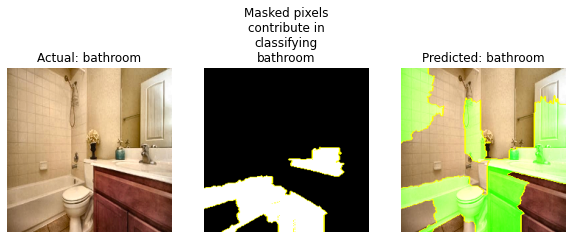

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'frontyard': 1.0, 'backyard': 0.0, 'livingRoom': 0.0, 'bedroom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


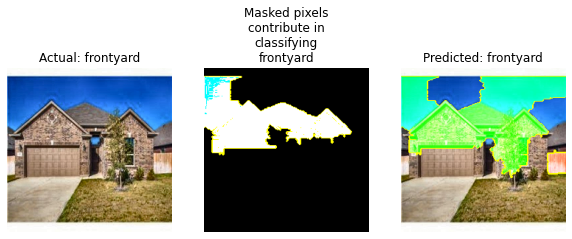

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.9791, 'livingRoom': 0.0198, 'bathroom': 0.0007, 'kitchen': 0.0005, 'backyard': 0.0, 'frontyard': 0.0}


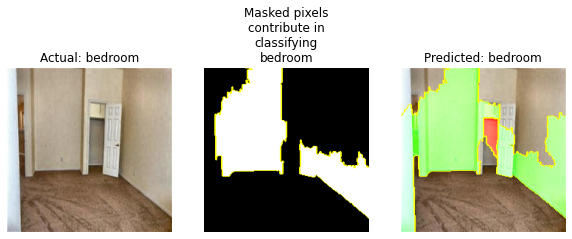

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

weights: {'backyard': 1.0, 'frontyard': 0.0, 'bedroom': 0.0, 'livingRoom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


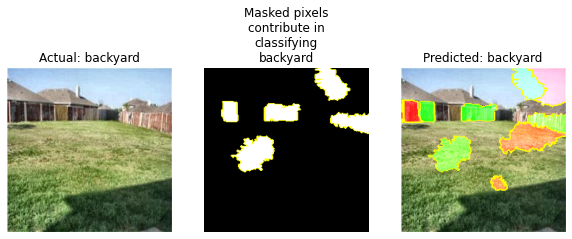

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.9055, 'livingRoom': 0.093, 'kitchen': 0.0013, 'bathroom': 0.0002, 'backyard': 0.0, 'frontyard': 0.0}


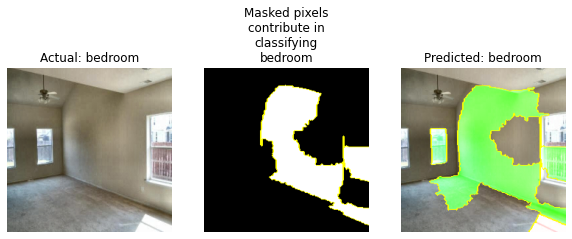

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'frontyard': 0.9991, 'backyard': 0.0009, 'livingRoom': 0.0, 'bedroom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


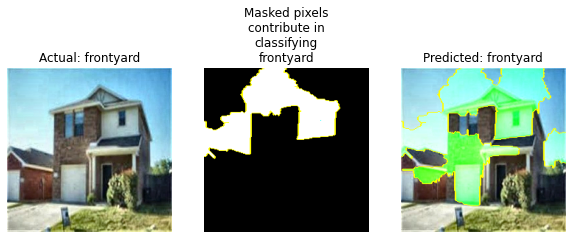

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'backyard': 0.6898, 'frontyard': 0.3102, 'kitchen': 0.0, 'bedroom': 0.0, 'livingRoom': 0.0, 'bathroom': 0.0}


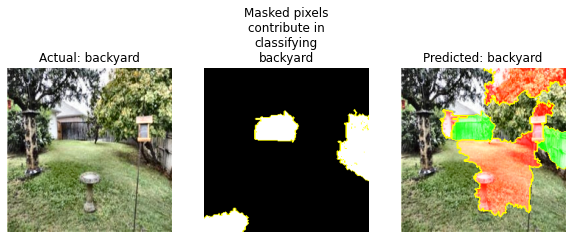

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'backyard': 0.9999, 'frontyard': 1e-04, 'bedroom': 0.0, 'livingRoom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


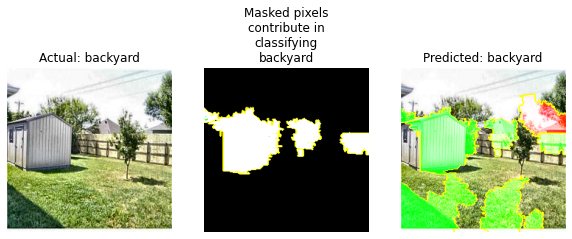

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'livingRoom': 0.9804, 'bedroom': 0.0196, 'kitchen': 0.0, 'bathroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


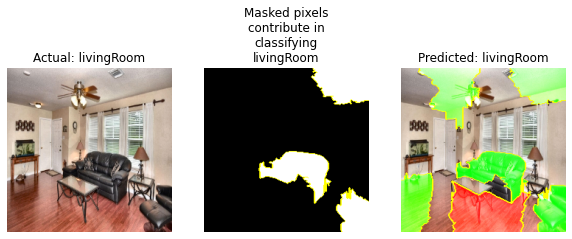

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'frontyard': 1.0, 'backyard': 0.0, 'livingRoom': 0.0, 'bedroom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


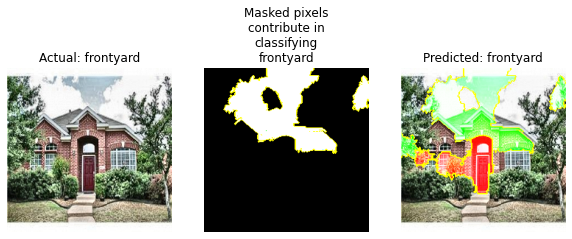

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'backyard': 0.9998, 'frontyard': 0.0002, 'livingRoom': 0.0, 'bedroom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


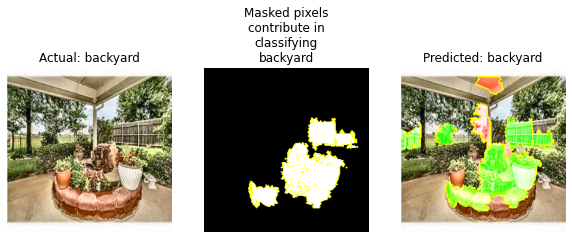

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 1.0, 'livingRoom': 0.0, 'bathroom': 0.0, 'kitchen': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


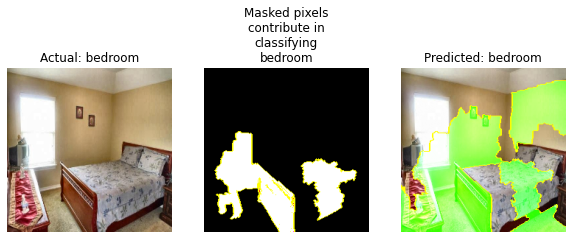

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'kitchen': 1.0, 'livingRoom': 0.0, 'bathroom': 0.0, 'bedroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


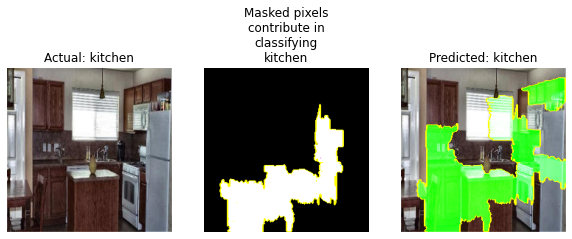

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'frontyard': 0.999, 'backyard': 0.001, 'livingRoom': 0.0, 'bedroom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


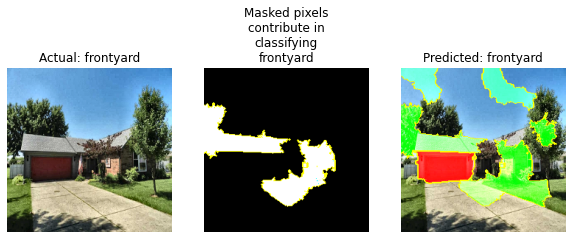

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'backyard': 1.0, 'frontyard': 0.0, 'bedroom': 0.0, 'livingRoom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


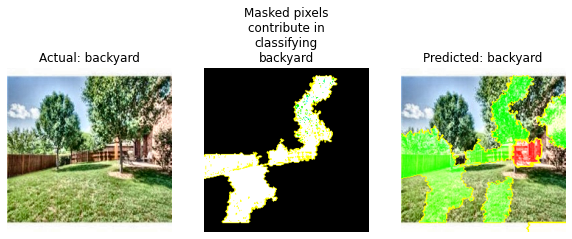

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'frontyard': 0.9887, 'backyard': 0.0113, 'livingRoom': 0.0, 'bedroom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


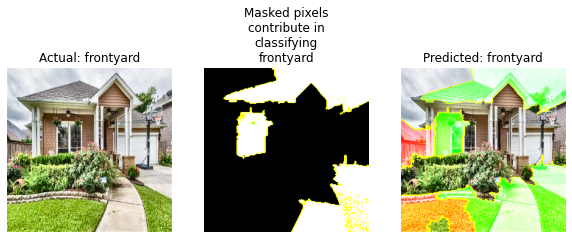

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bathroom': 1.0, 'kitchen': 0.0, 'bedroom': 0.0, 'livingRoom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


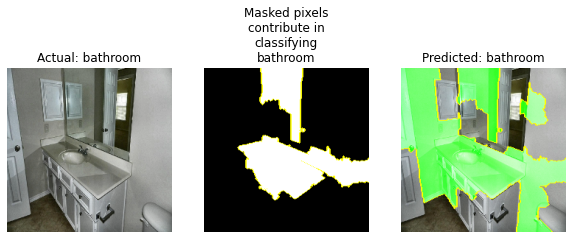

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.9875, 'livingRoom': 0.0125, 'bathroom': 0.0, 'kitchen': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


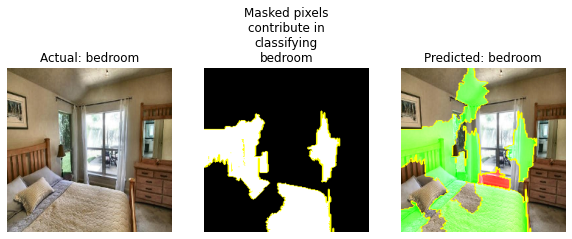

--------------------------------------------------------------------------------------------------------------


In [16]:
# generating 50 random number upto the length of val dataset
random_images = np.random.randint(0, len(val['paths']), 50)
# for each random number as index
for i in random_images:
    # img path
    v = val.values[i]
    # loading image
    img = cv.imread(str(v[0]))
    # img label
    actual_label = v[1]
    # resizing image
    img = cv.resize(img, TARGET_SHAPE, cv.INTER_AREA)
    # converting BGR ----> RGB color channel
    img = img[:,:,::-1]
    # getting enhanced image
    img = rf.get_enhanced_image(img)
    # preprocessing image using pretrained model preprocess function
    img = preprocess_input(img)
    # exapnding dimension to make img like (batch_size, H, W, Channel) format
    inp_img = tf.expand_dims(img, axis=0)
    # predicting img lables
    yhat = efficientNet_model.predict(inp_img)
    # getting predicted index
    ylabel = np.argmax(yhat)
    # getting predicted class label
    predicted_label = class_list[ylabel]
    # a dictionary which stores class labels weight in decreasing order
    weight = dict()
    # if actual label equals predicted label
    if actual_label == predicted_label:
        # adding key:value pair like predicted_labels:weights
        for idx, w in enumerate(yhat[0]):
            weight[class_list[idx]] = w
        # sorting weights dictionary in dcreasing order by weight value
        weights = {k: round(v,4) for k, v in sorted(weight.items(), key=lambda item: item[1], reverse=True)}
        # getting mask boundaries on image
        temp_1, mask_1, temp_2, mask_2 = get_mask_boundaries(img)
        # printing weights for each class
        print('weights:', weights)
        # ploting original image, masked image and mask boundaries on it
        mark_boundaries_on_image(img, temp_1, mask_1, temp_2, mask_2, actual_label, predicted_label, weights=weights)
        print('--'*55)
        
    

* <p style="font-size:14px; color:blue; font-style:italic; ">Let's see what causes the model to predict incorrect labels in val/test data.</p>

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.6561, 'bathroom': 0.1858, 'kitchen': 0.0926, 'livingRoom': 0.0648, 'backyard': 0.0006, 'frontyard': 1e-04}


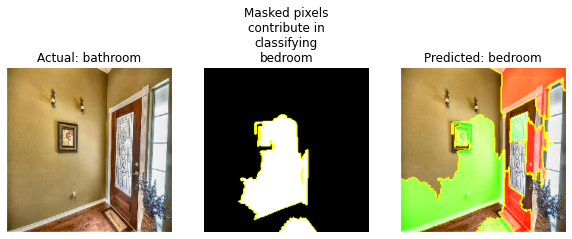

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.4479, 'kitchen': 0.3477, 'livingRoom': 0.1638, 'bathroom': 0.0404, 'backyard': 0.0002, 'frontyard': 0.0}


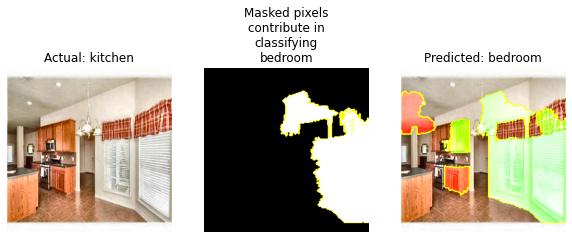

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'frontyard': 0.985, 'backyard': 0.015, 'livingRoom': 0.0, 'bedroom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


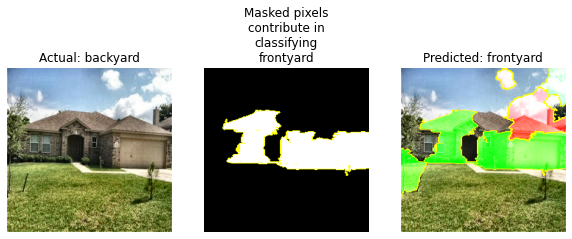

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.9982, 'livingRoom': 0.0009, 'bathroom': 0.0008, 'kitchen': 1e-04, 'backyard': 0.0, 'frontyard': 0.0}


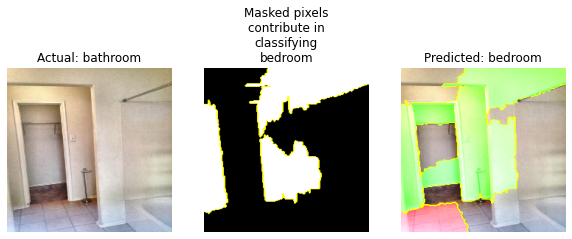

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'kitchen': 0.6383, 'bathroom': 0.3603, 'bedroom': 0.001, 'livingRoom': 0.0003, 'backyard': 0.0, 'frontyard': 0.0}


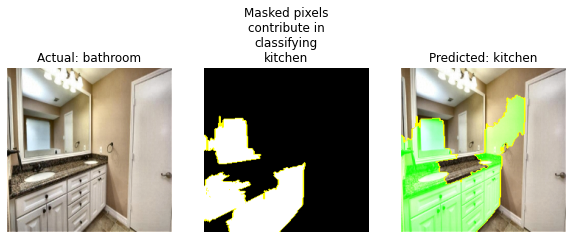

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.9986, 'livingRoom': 0.0014, 'bathroom': 0.0, 'kitchen': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


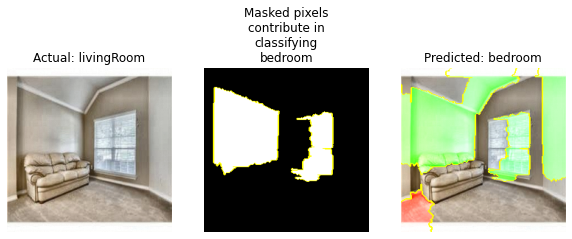

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'kitchen': 0.9994, 'bathroom': 0.0003, 'livingRoom': 0.0002, 'bedroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


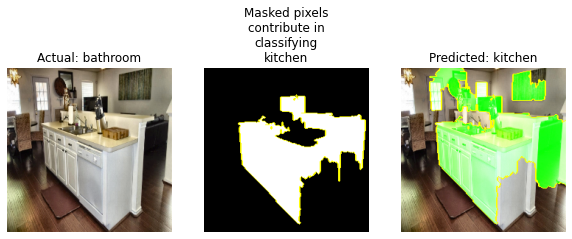

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'backyard': 0.9993, 'frontyard': 0.0007, 'bedroom': 0.0, 'livingRoom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


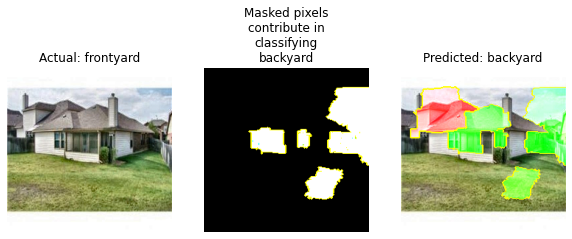

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'livingRoom': 0.5221, 'bedroom': 0.477, 'kitchen': 0.0006, 'bathroom': 0.0003, 'backyard': 0.0, 'frontyard': 0.0}


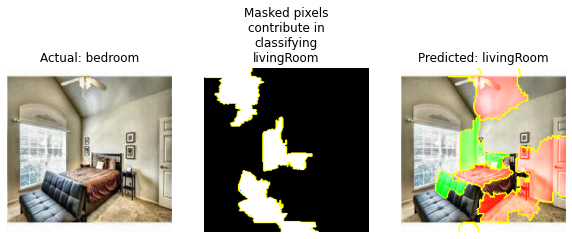

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'livingRoom': 0.3529, 'kitchen': 0.3078, 'bedroom': 0.3008, 'bathroom': 0.033, 'backyard': 0.0051, 'frontyard': 0.0004}


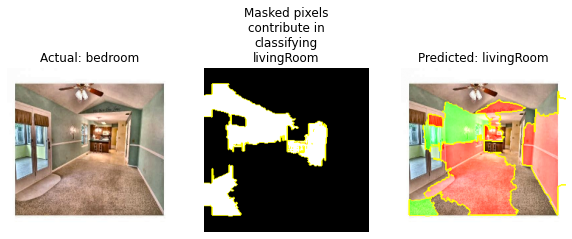

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'livingRoom': 0.9805, 'bedroom': 0.0195, 'kitchen': 0.0, 'bathroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


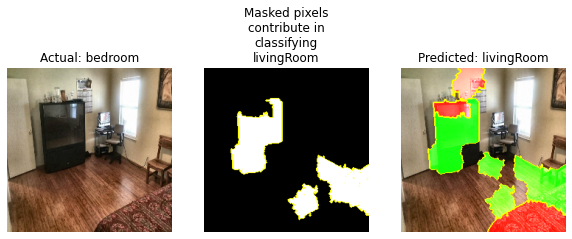

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.5134, 'livingRoom': 0.223, 'kitchen': 0.1831, 'bathroom': 0.0682, 'backyard': 0.011, 'frontyard': 0.0014}


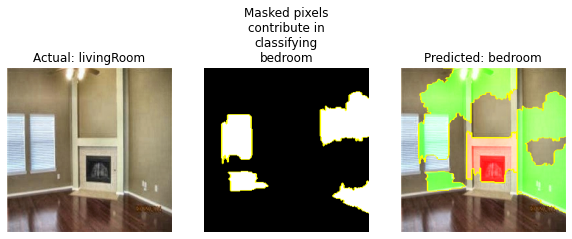

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'backyard': 0.9885, 'frontyard': 0.0114, 'bedroom': 0.0, 'livingRoom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


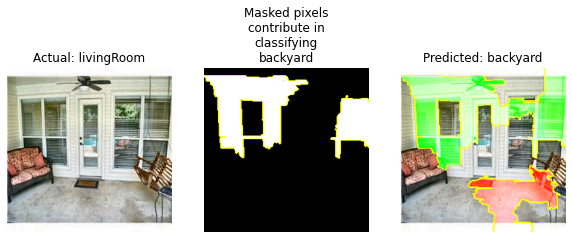

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'livingRoom': 0.5073, 'bedroom': 0.4926, 'kitchen': 0.0, 'bathroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


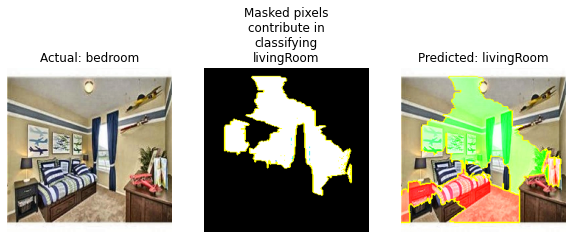

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'frontyard': 0.669, 'backyard': 0.3278, 'kitchen': 0.0025, 'livingRoom': 0.0005, 'bedroom': 0.0002, 'bathroom': 0.0}


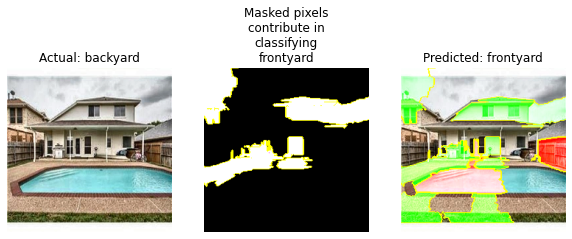

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.5705, 'livingRoom': 0.4275, 'kitchen': 0.0012, 'bathroom': 0.0008, 'backyard': 0.0, 'frontyard': 0.0}


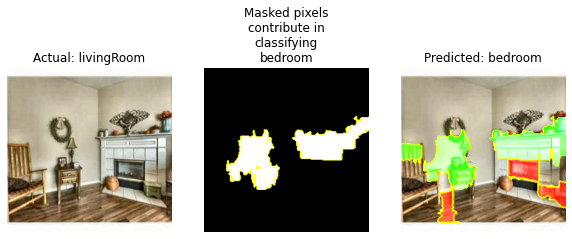

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'backyard': 0.5892, 'frontyard': 0.4108, 'bedroom': 0.0, 'kitchen': 0.0, 'livingRoom': 0.0, 'bathroom': 0.0}


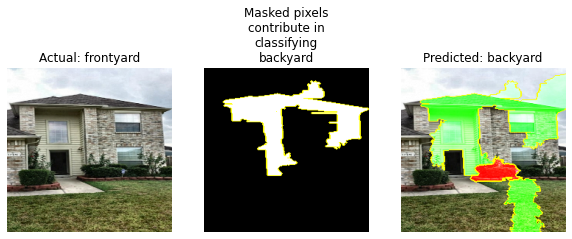

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bathroom': 0.8197, 'kitchen': 0.1792, 'bedroom': 0.0006, 'livingRoom': 0.0004, 'backyard': 0.0, 'frontyard': 0.0}


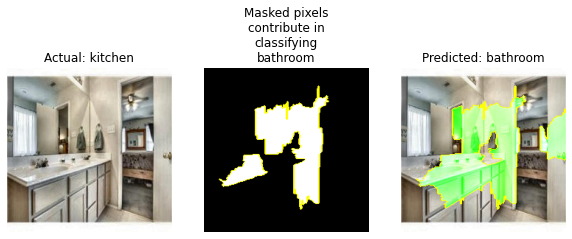

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'frontyard': 0.9121, 'backyard': 0.0879, 'livingRoom': 0.0, 'kitchen': 0.0, 'bedroom': 0.0, 'bathroom': 0.0}


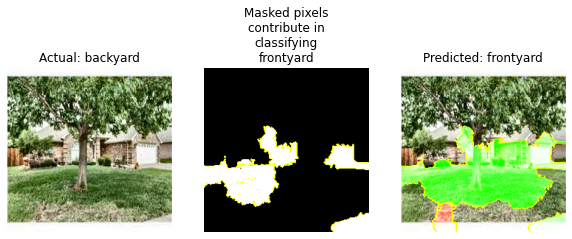

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.6148, 'livingRoom': 0.3829, 'kitchen': 0.002, 'bathroom': 0.0002, 'backyard': 0.0, 'frontyard': 0.0}


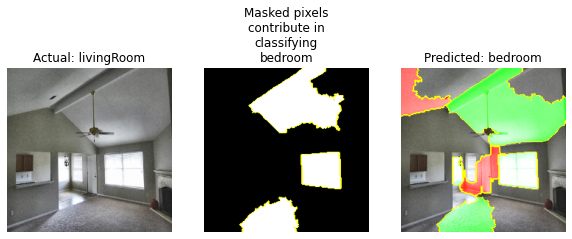

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

weights: {'livingRoom': 0.972, 'bedroom': 0.0141, 'kitchen': 0.0139, 'bathroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


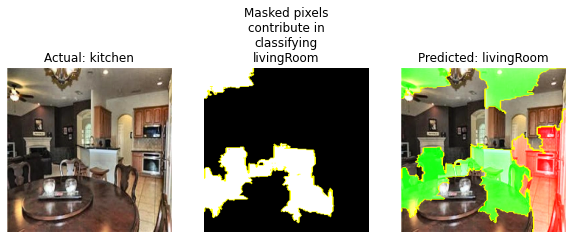

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'kitchen': 0.662, 'livingRoom': 0.2853, 'bedroom': 0.0524, 'bathroom': 0.0003, 'backyard': 0.0, 'frontyard': 0.0}


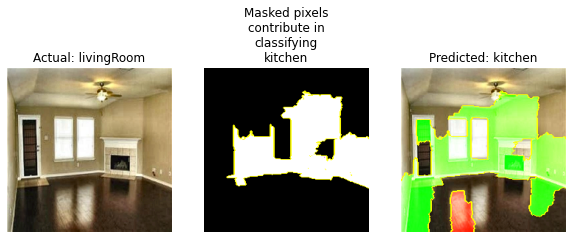

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.644, 'livingRoom': 0.3556, 'kitchen': 0.0003, 'bathroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


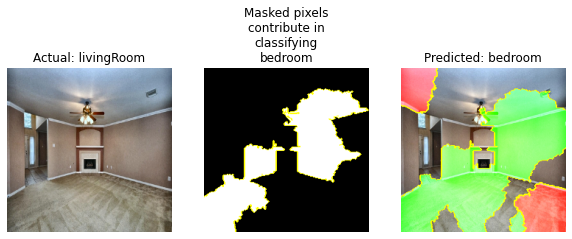

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.9714, 'livingRoom': 0.0286, 'bathroom': 0.0, 'kitchen': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


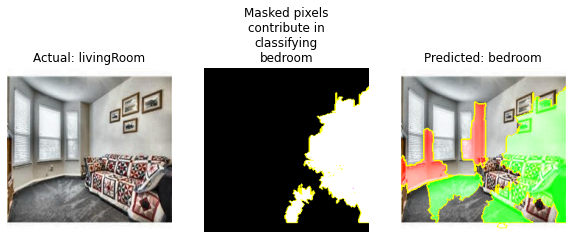

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

weights: {'backyard': 0.6972, 'frontyard': 0.3028, 'bedroom': 0.0, 'kitchen': 0.0, 'livingRoom': 0.0, 'bathroom': 0.0}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


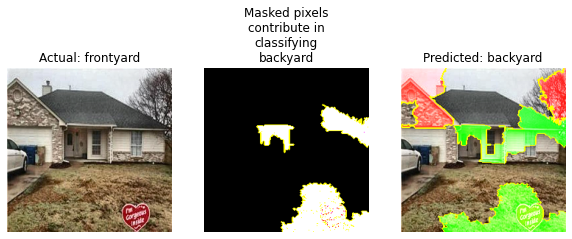

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.7465, 'livingRoom': 0.2534, 'kitchen': 0.0, 'bathroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


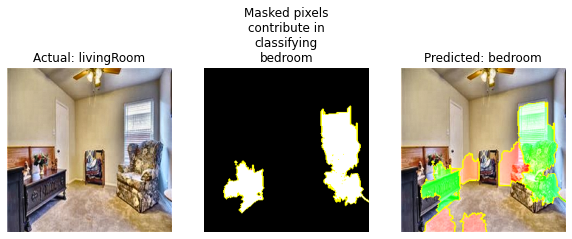

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.5798, 'livingRoom': 0.4194, 'kitchen': 0.0004, 'bathroom': 0.0004, 'backyard': 0.0, 'frontyard': 0.0}


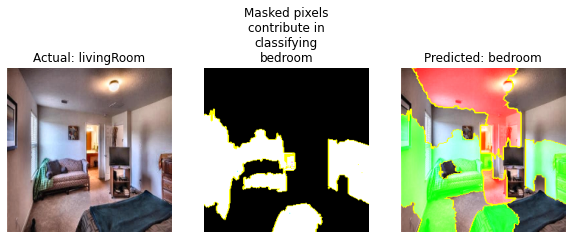

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'livingRoom': 0.6669, 'bedroom': 0.3265, 'kitchen': 0.0066, 'bathroom': 1e-04, 'backyard': 0.0, 'frontyard': 0.0}


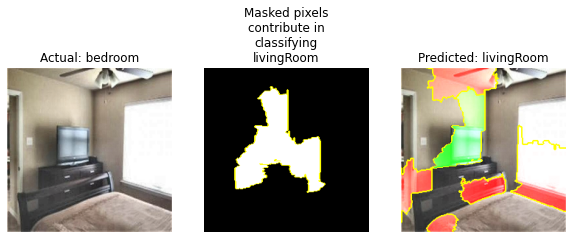

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.4213, 'livingRoom': 0.2413, 'kitchen': 0.21, 'bathroom': 0.1052, 'backyard': 0.0187, 'frontyard': 0.0034}


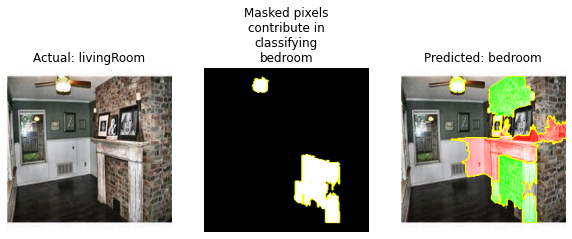

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'livingRoom': 0.5082, 'bedroom': 0.4798, 'kitchen': 0.0071, 'bathroom': 0.0045, 'backyard': 0.0004, 'frontyard': 0.0}


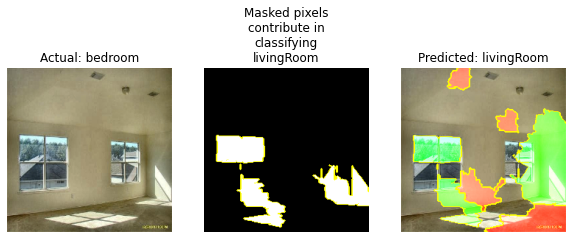

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.6724, 'livingRoom': 0.324, 'kitchen': 0.0033, 'bathroom': 0.0003, 'backyard': 0.0, 'frontyard': 0.0}


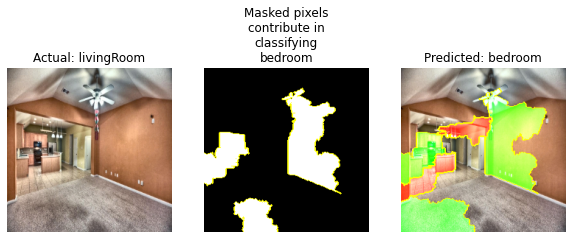

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.5394, 'livingRoom': 0.4606, 'kitchen': 0.0, 'bathroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


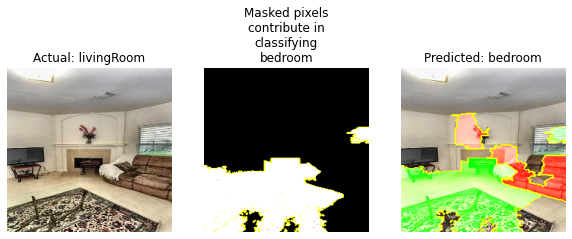

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'backyard': 1.0, 'frontyard': 0.0, 'bedroom': 0.0, 'livingRoom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


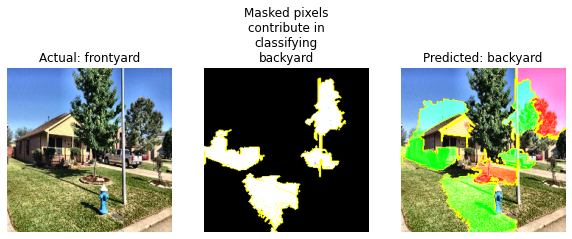

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'frontyard': 0.8997, 'backyard': 0.1003, 'kitchen': 0.0, 'bedroom': 0.0, 'livingRoom': 0.0, 'bathroom': 0.0}


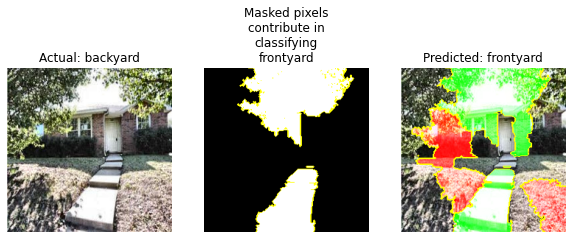

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'kitchen': 0.9999, 'livingRoom': 1e-04, 'bathroom': 0.0, 'bedroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


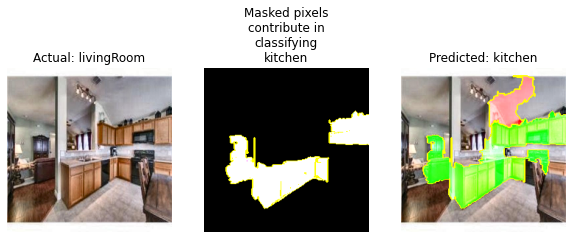

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'backyard': 0.8461, 'frontyard': 0.1538, 'bedroom': 0.0, 'kitchen': 0.0, 'livingRoom': 0.0, 'bathroom': 0.0}


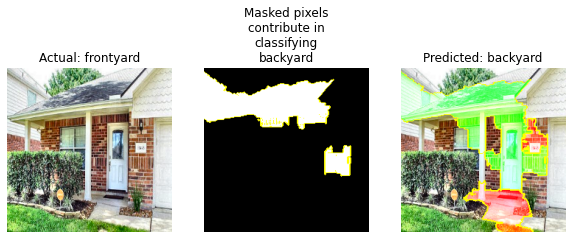

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'frontyard': 0.6078, 'backyard': 0.3922, 'kitchen': 0.0, 'bedroom': 0.0, 'livingRoom': 0.0, 'bathroom': 0.0}


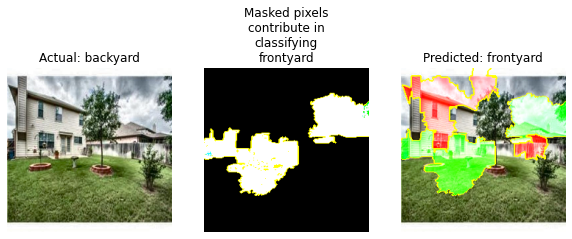

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'livingRoom': 0.5261, 'kitchen': 0.3244, 'bedroom': 0.1387, 'bathroom': 0.0104, 'backyard': 0.0005, 'frontyard': 0.0}


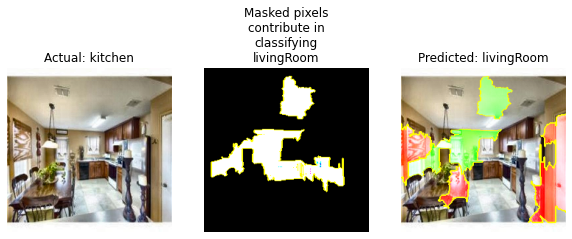

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'backyard': 0.915, 'frontyard': 0.085, 'bedroom': 0.0, 'kitchen': 0.0, 'livingRoom': 0.0, 'bathroom': 0.0}


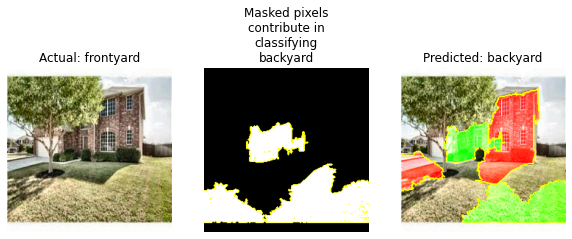

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.8836, 'bathroom': 0.1057, 'kitchen': 0.0075, 'livingRoom': 0.0033, 'backyard': 0.0, 'frontyard': 0.0}


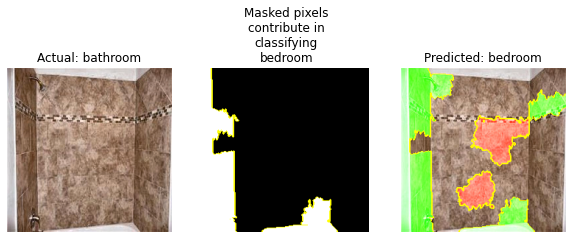

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'livingRoom': 0.833, 'bedroom': 0.1497, 'kitchen': 0.0172, 'bathroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


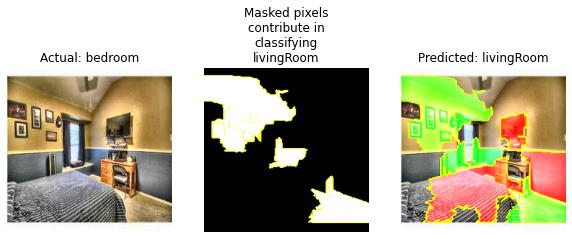

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'backyard': 0.6884, 'frontyard': 0.3116, 'kitchen': 0.0, 'bedroom': 0.0, 'livingRoom': 0.0, 'bathroom': 0.0}


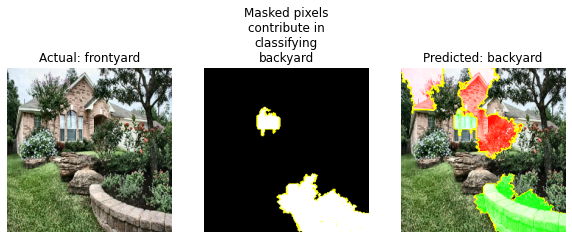

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'frontyard': 0.5408, 'backyard': 0.4592, 'kitchen': 0.0, 'bedroom': 0.0, 'livingRoom': 0.0, 'bathroom': 0.0}


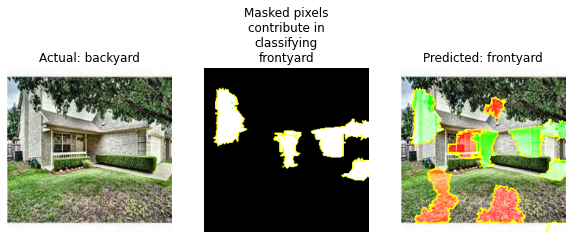

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'livingRoom': 0.5251, 'kitchen': 0.3985, 'bedroom': 0.0707, 'bathroom': 0.0056, 'backyard': 0.0, 'frontyard': 0.0}


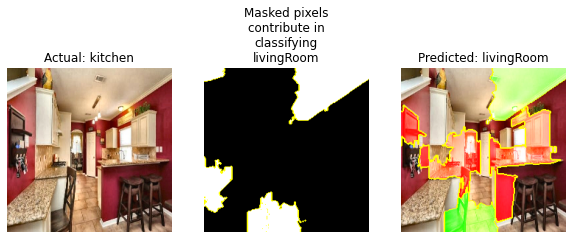

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.3835, 'kitchen': 0.3178, 'livingRoom': 0.2197, 'backyard': 0.046, 'bathroom': 0.0305, 'frontyard': 0.0024}


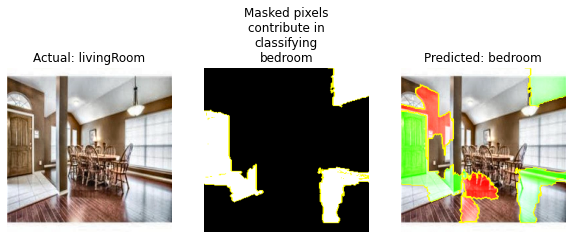

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'kitchen': 1.0, 'livingRoom': 0.0, 'bathroom': 0.0, 'bedroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


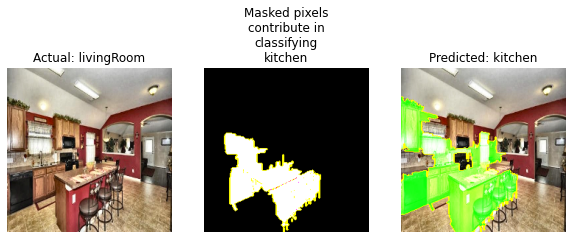

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.3689, 'livingRoom': 0.2879, 'kitchen': 0.2234, 'bathroom': 0.0898, 'backyard': 0.0251, 'frontyard': 0.0049}


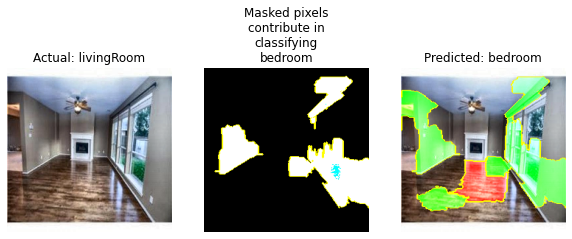

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'frontyard': 0.9525, 'backyard': 0.0475, 'bedroom': 0.0, 'livingRoom': 0.0, 'kitchen': 0.0, 'bathroom': 0.0}


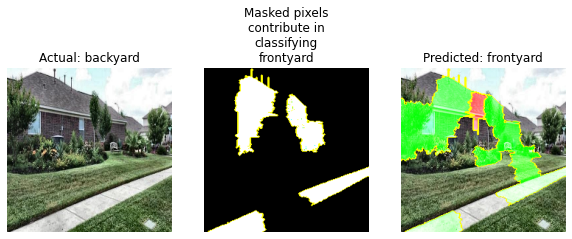

--------------------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


weights: {'bedroom': 0.8596, 'livingRoom': 0.1404, 'kitchen': 0.0, 'bathroom': 0.0, 'backyard': 0.0, 'frontyard': 0.0}


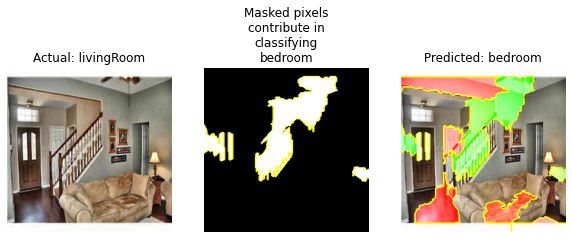

--------------------------------------------------------------------------------------------------------------


In [17]:
# for each datapoint in val data
for i,v in enumerate(val.values):
    # load img
    img = cv.imread(str(v[0]))
    # actual label
    actual_label = v[1]
    # resize label
    img = cv.resize(img, TARGET_SHAPE, cv.INTER_AREA)
    # changing color channel from BGR ----> RGB of image
    img = img[:,:,::-1]
    # getting enhanced image
    img = rf.get_enhanced_image(img)
    # preprocessing image using pretrained preprocess function
    img = preprocess_input(img)
    # exapnding dimension to make img like (batch_size, H, W, Channel) format
    inp_img = tf.expand_dims(img, axis=0)
    # predicting class label on image
    yhat = efficientNet_model.predict(inp_img)
    # getting index of predicted class
    ylabel = np.argmax(yhat)
    # predicted label
    predicted_label = class_list[ylabel]
    # a dictionary which stores class labels weight in decreasing order
    weight = dict()
    # if actual label not equals predicted label
    if actual_label != predicted_label:
        # adding key:value pair like predicted_labels:weights
        for idx, w in enumerate(yhat[0]):
            weight[class_list[idx]] = w
        # sorting weights dictionary in dcreasing order by weight value
        weights = {k: round(v,4) for k, v in sorted(weight.items(), key=lambda item: item[1], reverse=True)}
        # getting mask boundaries on image
        temp_1, mask_1, temp_2, mask_2 = get_mask_boundaries(img)
        # printing weights for each class
        print('weights:', weights)
        # ploting original image, masked image and mask boundaries on it
        mark_boundaries_on_image(img, temp_1, mask_1, temp_2, mask_2, actual_label, predicted_label, weights=weights)
        print('--'*55)
        
    

<p style="font-size:20px; font-style:italic; font-weight:bold">Error causing reasons</p>

<p style="font-size:14px; color:green; font-style:italic; ">1.&ensp; From the above error analysis, I found that there are some images whose actual label tagging is not matching with the scene type in it.</p>

<p style="font-size:14px; color:green; font-style:italic; ">2.&ensp; Some images having both kitchen and living room attached this makes model cofussing, which results error in predicting labels kitchens and living rooms. We can see those green shaded areas in images which shows the green colored area contributing and red colored area not contributing in predicting class.</p>

<p style="font-size:14px; color:green; font-style:italic; ">3.&ensp; some bedroom & living room images are empty it means there is no bed or somthing, and the prediction label is vice-versa for those images in many case because in images we can see clearly that these stuffs contributes in predicting class because all of them are covered in grean colored area in majority of the images.</p>

<p style="font-size:14px; color:green; font-style:italic; ">4.&ensp; Some living room contains many stuffs like couch, some furnitures, etc. which looks like a bed and other stuffs from bedroom in some manner for model I guess, this results predicting living room into the bedroom and vice versa. This can also be seen in images in which these stuffs are covered in green colored area.</p>

<p style="font-size:14px; color:green; font-style:italic; ">5.&ensp; Many images having kitchens predicted as bathroom because of the wash basins and the wood furniture that looks like similar for both kitchens and bathrooms. We can see in masked and green colored covered images which shows the green colored area contributing predicting class.</p>

<p style="font-size:14px; color:green; font-style:italic; ">6.&ensp; Frontyard images mostly correctly classified using front view of house and backyard as well by using back view but some frontyard images are looking similar to backyard images and vice-versa with very minute differences, this may lead in wrong prediction for frontyard and backyard.</p>

<p style="font-size:14px; color:green; font-style:italic; ">7.&ensp; Some bathroom images, kitchen images and bedroom images consists of walls/corners only, model predicts thses only by using these walls/corners/roofs. In some cases these leads in wrong classification of labels .</p>

<p style="font-size:14px; color:green; font-style:italic; ">8.&ensp; And some of them are pure mis-classification made by model, this may happening because of the above irregularities in the dataset.</p>

<p style="font-size:20px; font-style:italic; font-weight:bold">Possible solutions to get rid of those errors</p>

<p style="font-size:14px; color:green; font-style:italic; ">1.&ensp; We need to remove those incorrect tagging from the train datasets and gather some more good pictures of them and then retrain our model on new and best quality dataset.</p>

<p style="font-size:14px; color:green; font-style:italic; ">2.&ensp; These images should also be removed, or to get more and more images consits of both kitchen and living room images but one of the scene should be in majority. Suppose, if an image having both kitchen and living room with the actual class label kitchen then it should have majority of pixels/image portions of kitchen scene type or vice versa.</p>

<p style="font-size:14px; color:green; font-style:italic; ">3.&ensp; For these also more good images that describes particular class labels with more accuarcy are required or need to remove those images from dataset.</p>

<p style="font-size:14px; color:green; font-style:italic; ">4.&ensp; For 4th point, the images sholud have in large quantity and good quality (lighting and view) images that leads in good features in those images.</p>

<p style="font-size:14px; color:green; font-style:italic; ">5.&ensp; For 5th point, The kitchen images should have more kitchen stufffs information in it, which helps model to make dscision and vice-versa. We've seen in some pictures that they are not contributing more but still our model gives them the 2nd highest weights in many case because those stuffs are covered in red colored area which shows these features are contributing in not to predict other than kitchen. This shows that if we have these features clearly explained in image then it might predicts the original class label.</p>

<p style="font-size:14px; color:green; font-style:italic; ">6.&ensp; For 6th point, this requires a large images quantity with some proper difference like the clear walk way, front and back house view and correct label tagging, etc.</p>

<p style="font-size:14px; color:green; font-style:italic; ">7.&ensp; These types of images needs to be removed from the dataset, because these images doesn't make sense. Even humans can face difficulty in classify class label after seeing walls or corner area only.</p>

<p style="font-size:14px; color:green; font-style:italic; ">8.&ensp; If all those irregularities from the dataset removed then might be our model performs well on the pure misclassification error.</p>